In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from dython import nominal

In [2]:
df = pd.read_csv('ibm-hr-analytics-attrition-dataset.csv')

In [3]:
df.shape

(1470, 35)

In [4]:
df.head().T

,0,1,2,3,4
Age,41,49,37,33,27
Attrition,Yes,No,Yes,No,No
BusinessTravel,Travel_Rarely,Travel_Frequently,Travel_Rarely,Travel_Frequently,Travel_Rarely
DailyRate,1102,279,1373,1392,591
Department,Sales,Research & Development,Research & Development,Research & Development,Research & Development
DistanceFromHome,1,8,2,3,2
Education,2,1,2,4,1
EducationField,Life Sciences,Life Sciences,Other,Life Sciences,Medical
EmployeeCount,1,1,1,1,1
EmployeeNumber,1,2,4,5,7


In [5]:
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

In [7]:
df.BusinessTravel.unique()

array(['Travel_Rarely', 'Travel_Frequently', 'Non-Travel'], dtype=object)

In [8]:
df.isna().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.00,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.00,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.00,7.0,14.00,29.0
Education,1470.0,2.912925,1.024165,1.0,2.00,3.0,4.00,5.0
EmployeeCount,1470.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
EmployeeNumber,1470.0,1024.865306,602.024335,1.0,491.25,1020.5,1555.75,2068.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.00,3.0,4.00,4.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.00,66.0,83.75,100.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.00,3.0,3.00,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.00,2.0,3.00,5.0


In [10]:
df.WorkLifeBalance.value_counts()

3    893
2    344
4    153
1     80
Name: WorkLifeBalance, dtype: int64

In [11]:
df.StandardHours.value_counts()

80    1470
Name: StandardHours, dtype: int64

In [12]:
df.StockOptionLevel.value_counts()

0    631
1    596
2    158
3     85
Name: StockOptionLevel, dtype: int64

In [13]:
df.TrainingTimesLastYear.value_counts()

2    547
3    491
4    123
5    119
1     71
6     65
0     54
Name: TrainingTimesLastYear, dtype: int64

In [14]:
df.EmployeeCount.value_counts()

1    1470
Name: EmployeeCount, dtype: int64

In [15]:
df.EmployeeNumber.nunique()

1470

In [3]:
df=df.drop(columns=["EmployeeCount","EmployeeNumber",'StandardHours','Over18'])

In [17]:
df.describe(include='O')

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime
count,1470,1470,1470,1470,1470,1470,1470,1470,1470
unique,2,3,3,6,2,9,3,1,2
top,No,Travel_Rarely,Research & Development,Life Sciences,Male,Sales Executive,Married,Y,No
freq,1233,1043,961,606,882,326,673,1470,1054


In [19]:
import plotly.tools as tls
import plotly.offline as py
import plotly.graph_objs as go

cat_cols = list(df.select_dtypes(exclude=np.number).columns)
#cat_cols.remove('Attrition') 

fig_rows = 2
fig_cols = 4
fig = tls.make_subplots(rows=fig_rows, cols=fig_cols, 
                          subplot_titles=tuple(cat_cols));
curr_row = 1
curr_col = 1
for i, col in enumerate(cat_cols):
    trace = go.Bar(name=col,
                x= df[col].value_counts().index.values,
                y= df[col].value_counts().values,
                marker=dict(line=dict(color='black',width=1)))
    fig.append_trace(trace, curr_row, curr_col)
    curr_col+=1
    if curr_col >= fig_cols+1: # Zero Indexing for '-1'
        curr_row += 1
        curr_col = 1

fig['layout'].update(title =  'Count of Categorical Variables in Dataset', width = 900, height = 600,
                    showlegend=False)

py.iplot(fig)

/home/ubuntu/anaconda3/lib/python3.6/site-packages/plotly/tools.py:465: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



In [27]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [4]:
df=df.drop(columns=['JobRole','PerformanceRating','TotalWorkingYears','JobLevel'])

In [20]:
df.shape

(1470, 31)

In [45]:
dh=df.corr(method='pearson')

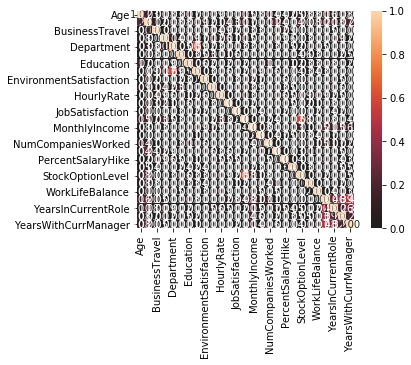

In [46]:
#Plot features correlation and association for mixed data-sets (categorical and continuous features) in an easy and simple way
d=nominal.associations(df, nominal_columns='all')
print(d['corr'])

In [47]:
a=list(dh.columns)
b=list(d['corr'].columns)
L=b
for x in a:
    if x in b:
        L.remove(x)

In [48]:
dh.join(d['corr'][L])

                               Age  Attrition  BusinessTravel  DailyRate  \
Age                       1.000000   0.229164        0.000000   0.084797   
Attrition                 0.229164   1.000000        0.122880   0.000000   
BusinessTravel            0.000000   0.122880        1.000000   0.000000   
DailyRate                 0.084797   0.000000        0.000000   1.000000   
Department                0.034715   0.077375        0.000000   0.141710   
DistanceFromHome          0.000000   0.083121        0.000000   0.000000   
Education                 0.168062   0.000000        0.000000   0.086601   
EducationField            0.000000   0.086617        0.000000   0.168076   
EnvironmentSatisfaction   0.000000   0.115220        0.000000   0.000000   
Gender                    0.088511   0.008897        0.037174   0.124773   
HourlyRate                0.000000   0.036723        0.091220   0.056433   
JobInvolvement            0.000000   0.131727        0.016229   0.108241   
JobSatisfact

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobSatisfaction,MonthlyIncome,MonthlyRate,...,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,BusinessTravel,Department,EducationField,Gender,MaritalStatus,OverTime
Age,1.000000,0.010661,-0.001686,0.208034,0.010146,0.024287,0.029820,-0.004892,0.497855,0.028051,...,0.212901,0.216513,0.202089,0.229164,0.000000,0.034715,0.000000,0.088511,0.148074,0.039896
DailyRate,0.010661,1.000000,-0.004985,-0.016806,0.018355,0.023381,0.046135,0.030571,0.007707,-0.032182,...,0.009932,-0.033229,-0.026363,0.000000,0.000000,0.141710,0.168076,0.124773,0.150700,0.094508
DistanceFromHome,-0.001686,-0.004985,1.000000,0.021042,-0.016075,0.031131,0.008783,-0.003669,-0.017014,0.027473,...,0.018845,0.010029,0.014406,0.083121,0.000000,0.054159,0.049593,0.096597,0.002980,0.000000
Education,0.208034,-0.016806,0.021042,1.000000,-0.027128,0.016775,0.042438,-0.011296,0.094961,-0.026084,...,0.060236,0.054254,0.069065,0.000000,0.000000,0.000000,0.055176,0.000000,0.000000,0.001476
EnvironmentSatisfaction,0.010146,0.018355,-0.016075,-0.027128,1.000000,-0.049857,-0.008278,-0.006784,-0.006259,0.037600,...,0.018007,0.016194,-0.004999,0.115220,0.000000,0.017813,0.030761,0.000000,0.019434,0.059529
HourlyRate,0.024287,0.023381,0.031131,0.016775,-0.049857,1.000000,0.042861,-0.071335,-0.015794,-0.015297,...,-0.024106,-0.026716,-0.020123,0.036723,0.091220,0.000000,0.063469,0.000000,0.129134,0.055951
JobInvolvement,0.029820,0.046135,0.008783,0.042438,-0.008278,0.042861,1.000000,-0.021476,-0.015271,-0.016322,...,0.008717,-0.024184,0.025976,0.131727,0.016229,0.000000,0.000000,0.000000,0.023822,0.000000
JobSatisfaction,-0.004892,0.030571,-0.003669,-0.011296,-0.006784,-0.071335,-0.021476,1.000000,-0.007157,0.000644,...,-0.002305,-0.018214,-0.027656,0.099362,0.000000,0.029321,0.017011,0.000000,0.000000,0.021611
MonthlyIncome,0.497855,0.007707,-0.017014,0.094961,-0.006259,-0.015794,-0.015271,-0.007157,1.000000,0.034814,...,0.363818,0.344978,0.344079,0.000000,0.025562,0.000000,0.089690,0.090587,0.000000,0.000000
MonthlyRate,0.028051,-0.032182,0.027473,-0.026084,0.037600,-0.015297,-0.016322,0.000644,0.034814,1.000000,...,-0.012815,0.001567,-0.036746,0.000000,0.000000,0.000000,0.000000,0.000000,0.020799,0.068476


In [49]:
d['corr'].loc[L]

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,OverTime,PercentSalaryHike,RelationshipSatisfaction,StockOptionLevel,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Attrition,0.229164,1.000000,0.122880,0.000000,0.077375,0.083121,0.000000,0.086617,0.115220,0.008897,...,0.242749,0.000000,0.039041,0.198010,0.078889,0.095234,0.201026,0.177512,0.068210,0.198026
BusinessTravel,0.000000,0.122880,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.037174,...,0.024089,0.088077,0.000000,0.000000,0.000000,0.000000,0.050561,0.000000,0.000000,0.053990
Department,0.034715,0.077375,0.000000,0.141710,1.000000,0.054159,0.000000,0.587962,0.017813,0.025605,...,0.000000,0.052574,0.019728,0.000000,0.000000,0.047058,0.000000,0.000000,0.000000,0.000000
EducationField,0.000000,0.086617,0.000000,0.168076,0.587962,0.049593,0.055176,1.000000,0.030761,0.000000,...,0.000000,0.000000,0.039827,0.032359,0.043669,0.026753,0.000000,0.000000,0.000000,0.000000
Gender,0.088511,0.008897,0.037174,0.124773,0.025605,0.096597,0.000000,0.000000,0.000000,1.000000,...,0.030833,0.049405,0.000000,0.000000,0.000000,0.000000,0.000000,0.055583,0.000000,0.000000
MaritalStatus,0.148074,0.173386,0.034524,0.150700,0.030019,0.002980,0.000000,0.000000,0.019434,0.032446,...,0.000000,0.000000,0.024990,0.581298,0.000000,0.000000,0.084340,0.002647,0.035362,0.000000
OverTime,0.039896,0.242749,0.024089,0.094508,0.000000,0.000000,0.001476,0.000000,0.059529,0.030833,...,1.000000,0.000000,0.025387,0.000000,0.099283,0.000000,0.000000,0.053888,0.000000,0.000000


In [50]:
d1=dh.join(d['corr'][L])
d1=d1[['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
   'DistanceFromHome', 'Education', 'EducationField',
   'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
   'JobSatisfaction', 'MaritalStatus', 'MonthlyIncome', 'MonthlyRate',
   'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike',
   'RelationshipSatisfaction', 'StockOptionLevel', 'TrainingTimesLastYear',
   'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
   'YearsSinceLastPromotion', 'YearsWithCurrManager']]

In [51]:
d['corr'].loc[L].columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobSatisfaction', 'MaritalStatus', 'MonthlyIncome', 'MonthlyRate',
       'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike',
       'RelationshipSatisfaction', 'StockOptionLevel', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [52]:
corr=pd.concat([d1,d['corr'].loc[L]])

In [53]:
corr=corr[['Age', 'DailyRate', 'DistanceFromHome', 'Education',
           'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement',
           'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
           'PercentSalaryHike', 'RelationshipSatisfaction', 'StockOptionLevel',
           'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany',
           'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager',
            'Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender',
            'MaritalStatus', 'OverTime']]

In [54]:
dh

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,RelationshipSatisfaction,StockOptionLevel,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,0.010661,-0.001686,0.208034,0.010146,0.024287,0.029820,-0.004892,0.497855,0.028051,0.299635,0.003634,0.053535,0.037510,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
DailyRate,0.010661,1.000000,-0.004985,-0.016806,0.018355,0.023381,0.046135,0.030571,0.007707,-0.032182,0.038153,0.022704,0.007846,0.042143,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
DistanceFromHome,-0.001686,-0.004985,1.000000,0.021042,-0.016075,0.031131,0.008783,-0.003669,-0.017014,0.027473,-0.029251,0.040235,0.006557,0.044872,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
Education,0.208034,-0.016806,0.021042,1.000000,-0.027128,0.016775,0.042438,-0.011296,0.094961,-0.026084,0.126317,-0.011111,-0.009118,0.018422,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065
EnvironmentSatisfaction,0.010146,0.018355,-0.016075,-0.027128,1.000000,-0.049857,-0.008278,-0.006784,-0.006259,0.037600,0.012594,-0.031701,0.007665,0.003432,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999
HourlyRate,0.024287,0.023381,0.031131,0.016775,-0.049857,1.000000,0.042861,-0.071335,-0.015794,-0.015297,0.022157,-0.009062,0.001330,0.050263,-0.008548,-0.004607,-0.019582,-0.024106,-0.026716,-0.020123
JobInvolvement,0.029820,0.046135,0.008783,0.042438,-0.008278,0.042861,1.000000,-0.021476,-0.015271,-0.016322,0.015012,-0.017205,0.034297,0.021523,-0.015338,-0.014617,-0.021355,0.008717,-0.024184,0.025976
JobSatisfaction,-0.004892,0.030571,-0.003669,-0.011296,-0.006784,-0.071335,-0.021476,1.000000,-0.007157,0.000644,-0.055699,0.020002,-0.012454,0.010690,-0.005779,-0.019459,-0.003803,-0.002305,-0.018214,-0.027656
MonthlyIncome,0.497855,0.007707,-0.017014,0.094961,-0.006259,-0.015794,-0.015271,-0.007157,1.000000,0.034814,0.149515,-0.027269,0.025873,0.005408,-0.021736,0.030683,0.514285,0.363818,0.344978,0.344079
MonthlyRate,0.028051,-0.032182,0.027473,-0.026084,0.037600,-0.015297,-0.016322,0.000644,0.034814,1.000000,0.017521,-0.006429,-0.004085,-0.034323,0.001467,0.007963,-0.023655,-0.012815,0.001567,-0.036746


In [55]:
corr=corr.reindex(index=['Age', 'DailyRate', 'DistanceFromHome', 'Education',
           'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement',
           'JobSatisfaction', 'WorkLifeBalance' , 'YearsSinceLastPromotion','MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
           'PercentSalaryHike', 'RelationshipSatisfaction', 'StockOptionLevel',
           'TrainingTimesLastYear', 'YearsAtCompany',
           'YearsInCurrentRole',
            'Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender',
            'MaritalStatus', 'YearsWithCurrManager', 'OverTime'])
corr=corr[['Age', 'DailyRate', 'DistanceFromHome', 'Education',
           'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement',
           'JobSatisfaction', 'WorkLifeBalance' , 'YearsSinceLastPromotion','MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
           'PercentSalaryHike', 'RelationshipSatisfaction', 'StockOptionLevel',
           'TrainingTimesLastYear', 'YearsAtCompany',
           'YearsInCurrentRole',
            'Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender',
            'MaritalStatus', 'YearsWithCurrManager', 'OverTime']]

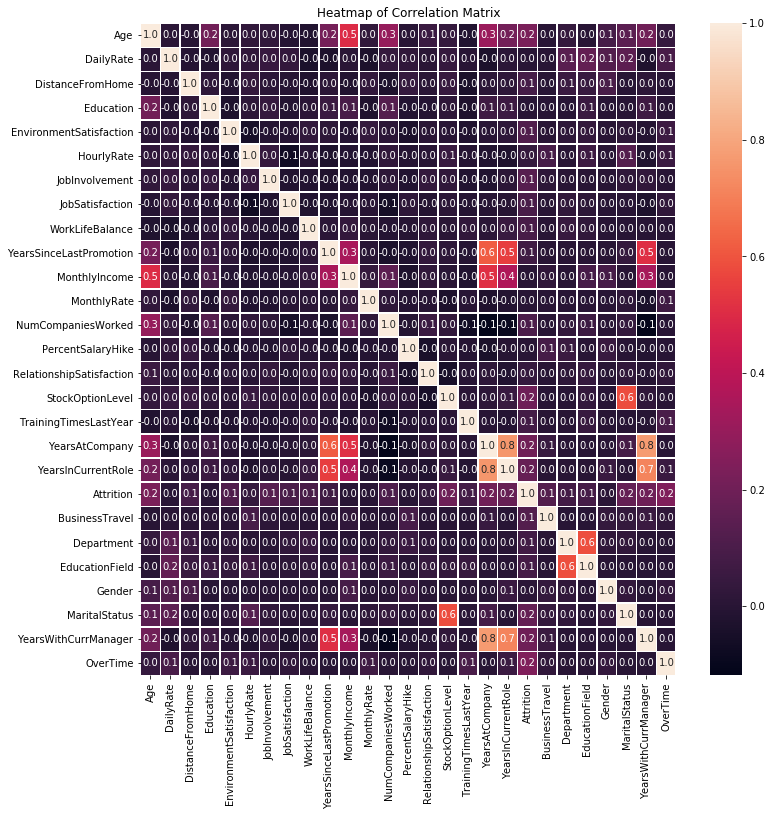

In [57]:
#plt.figure(figsize=(11,8.5))
f, ax = plt.subplots(figsize=(12,12))

corr=corr
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values,
            annot=True, linewidths=.5, fmt= '.1f',ax=ax
            )
ax.set_yticklabels(corr.columns, rotation = 0)
ax.set_xticklabels(corr.columns)

txt=plt.title('Heatmap of Correlation Matrix')

In [ ]:
df.shape

In [27]:
df.JobLevel.value_counts()

1    543
2    534
3    218
4    106
5     69
Name: JobLevel, dtype: int64

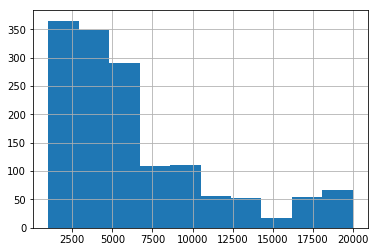

In [28]:
d=df.MonthlyIncome.hist()

In [29]:
df.YearsWithCurrManager.value_counts()

2     344
0     263
7     216
3     142
8     107
4      98
1      76
9      64
5      31
6      29
10     27
11     22
12     18
13     14
17      7
14      5
15      5
16      2
Name: YearsWithCurrManager, dtype: int64

In [30]:
df.TotalWorkingYears.value_counts()

10    202
6     125
8     103
9      96
5      88
1      81
7      81
4      63
12     48
3      42
15     40
16     37
13     36
11     36
21     34
17     33
14     31
2      31
20     30
18     27
19     22
23     22
22     21
24     18
25     14
28     14
26     14
0      11
29     10
31      9
32      9
27      7
30      7
33      7
36      6
34      5
37      4
35      3
40      2
38      1
Name: TotalWorkingYears, dtype: int64

In [31]:
df.PercentSalaryHike.value_counts()

11    210
13    209
14    201
12    198
15    101
18     89
17     82
16     78
19     76
22     56
20     55
21     48
23     28
24     21
25     18
Name: PercentSalaryHike, dtype: int64

In [7]:
df=df.drop(columns=["TotalWorkingYears","JobRole","PerformanceRating"])

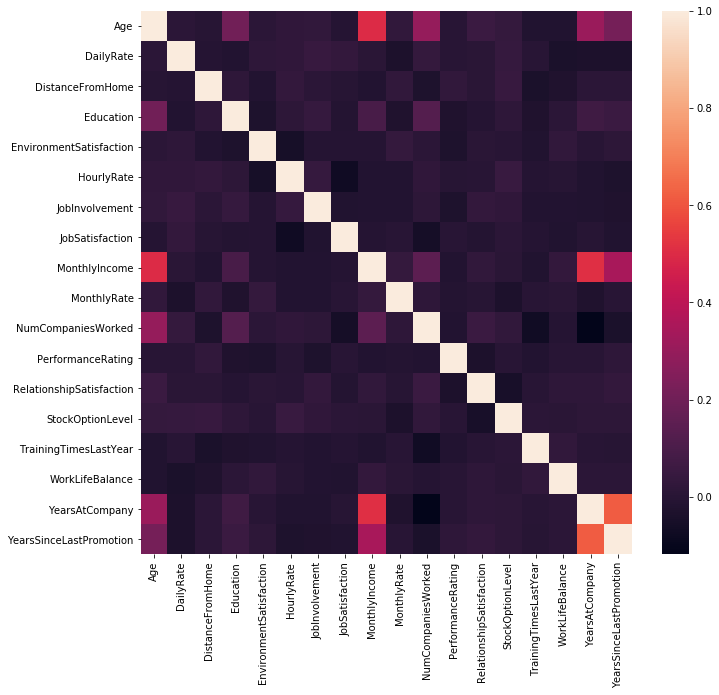

In [29]:
plt.figure(figsize=(11,10))
de=sns.heatmap(df.corr(), 
            xticklabels=df.corr().columns.values,
            yticklabels=df.corr().columns.values)

In [30]:
df.shape

(1470, 26)

In [8]:
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
OverTime                    object
PercentSalaryHike            int64
RelationshipSatisfaction     int64
StockOptionLevel             int64
TrainingTimesLastYear        int64
WorkLifeBalance              int64
YearsAtCompany               int64
YearsInCurrentRole           int64
YearsSinceLastPromotion      int64
YearsWithCurrManager         int64
dtype: object

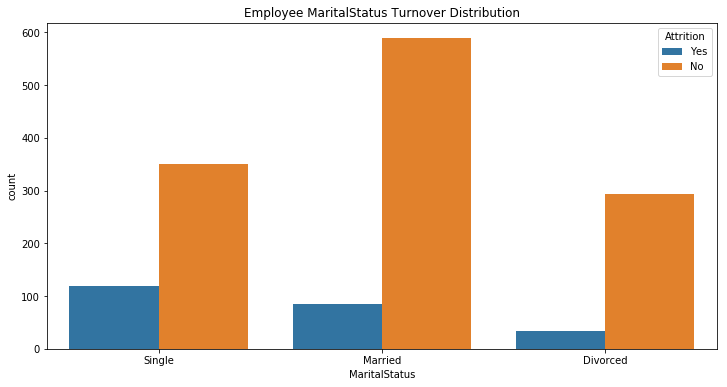

In [10]:
plt.figure(figsize=(12,6))
ax=sns.countplot(x=df['MaritalStatus'],hue=df['Attrition']).set_title('Employee MaritalStatus Turnover Distribution')

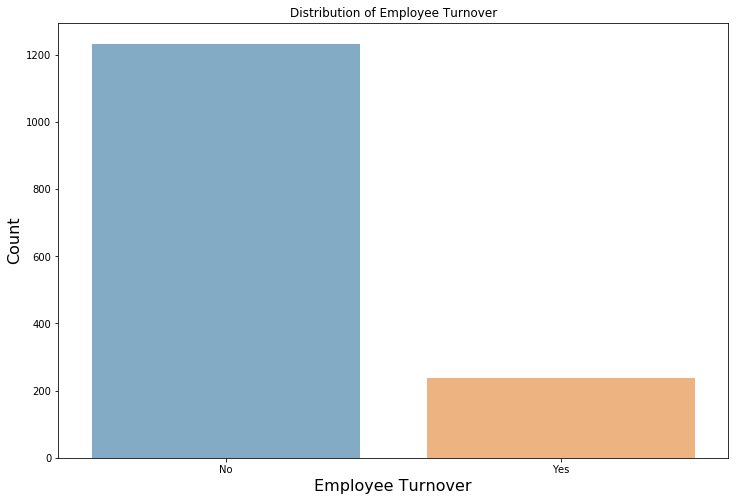

In [32]:
plt.figure(figsize=(12,8))
turnover = df.Attrition.value_counts()
sns.barplot(y=turnover.values, x=turnover.index, alpha=0.6)
plt.title('Distribution of Employee Turnover')
plt.xlabel('Employee Turnover', fontsize=16)
plt.ylabel('Count', fontsize=16);

In [33]:
df.Attrition.value_counts(True)

No     0.838776
Yes    0.161224
Name: Attrition, dtype: float64

# Age V.S. Turnover

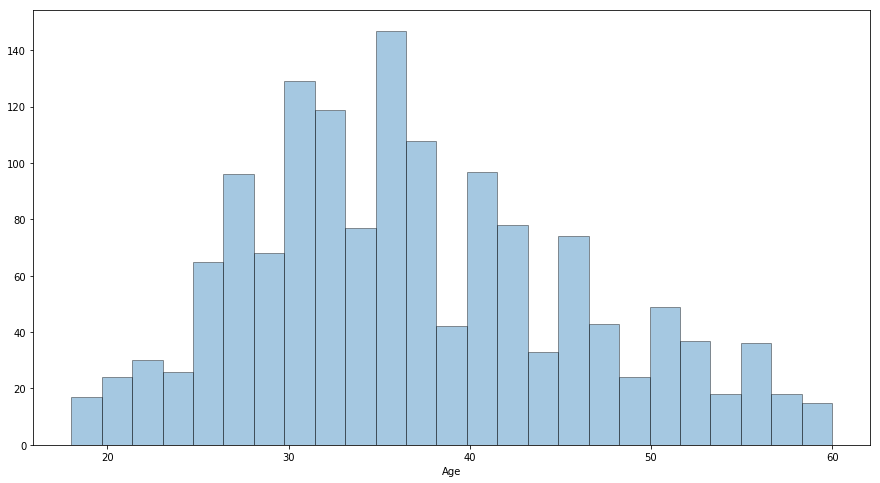

In [34]:
plt.figure(figsize=(15,8))
sn=sns.distplot(df.Age, kde = False , hist_kws = { 'edgecolor' : 'black' },bins=int ( 180 / 7))

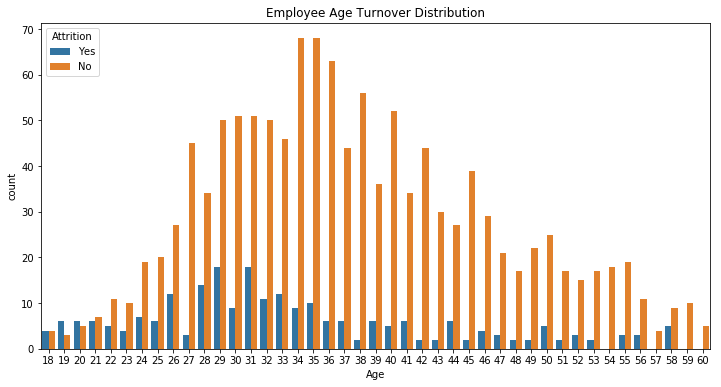

In [32]:
plt.figure(figsize=(12,6))
ax=sns.countplot(x=df['Age'],hue=df['Attrition']).set_title('Employee Age Turnover Distribution')

# DailyRate V.S. turnover

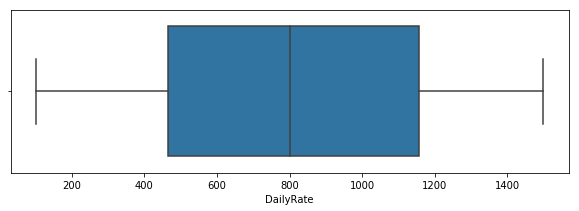

In [36]:
plt.figure(figsize=(10,3))
sn=sns.boxplot(df['DailyRate'])

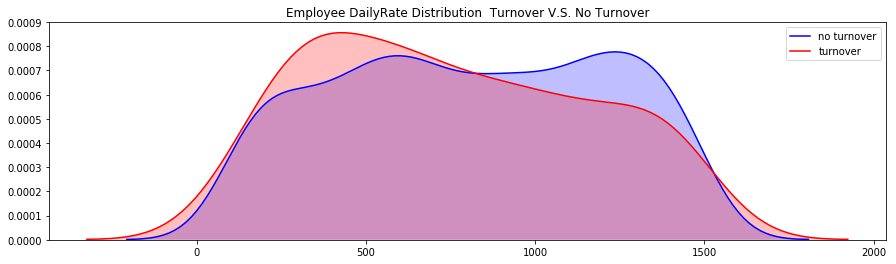

In [37]:
fig = plt.figure(figsize=(15,4),)
ax=sns.kdeplot(df.loc[(df['Attrition'] == 'No'),'DailyRate'] , color='b',shade=True,label='no turnover')
ax=sns.kdeplot(df.loc[(df['Attrition'] == 'Yes'),'DailyRate'] , color='r',shade=True, label='turnover')
a=plt.title('Employee DailyRate Distribution  Turnover V.S. No Turnover')

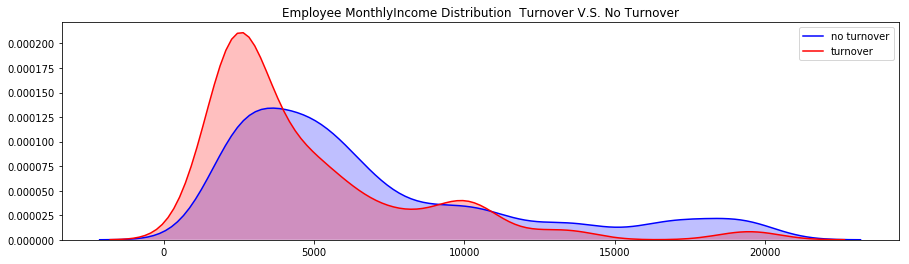

In [33]:
fig = plt.figure(figsize=(15,4),)
ax=sns.kdeplot(df.loc[(df['Attrition'] == 'No'),'MonthlyIncome'] , color='b',shade=True,label='no turnover')
ax=sns.kdeplot(df.loc[(df['Attrition'] == 'Yes'),'MonthlyIncome'] , color='r',shade=True, label='turnover')
a=plt.title('Employee MonthlyIncome Distribution  Turnover V.S. No Turnover')

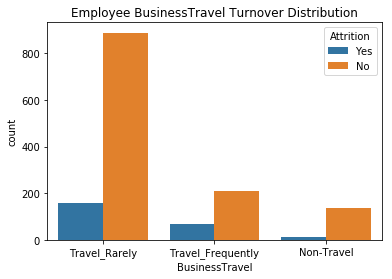

In [38]:
a=sns.countplot(x=df.BusinessTravel,hue=df.Attrition).set_title('Employee BusinessTravel Turnover Distribution')

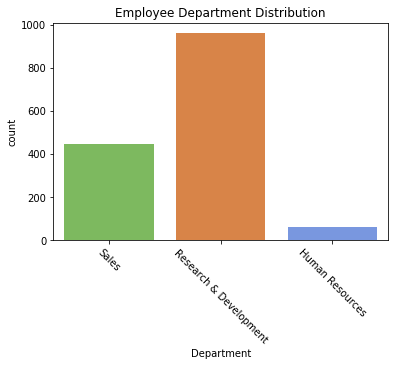

In [39]:
color_types = ['#78C850','#F08030','#6890F0','#A8B820','#A8A878','#A040A0','#F8D030',  
                '#E0C068','#EE99AC','#C03028','#F85888','#B8A038','#705898','#98D8D8','#7038F8']

#Count Plot (a.k.a. Bar Plot)
sns.countplot(x='Department', data=df, palette=color_types).set_title('Employee Department Distribution');
 
# Rotate x-labels
a=plt.xticks(rotation=-45)

In [40]:
hrleft = df[df['Attrition']=='Yes']

hrleft = pd.DataFrame(hrleft.Department.value_counts()).reset_index()
hrstay = pd.DataFrame( df.Department.value_counts()).reset_index()

hr_merge = pd.merge(hrleft, hrstay, how='inner', on='index')

hr_merge = hr_merge.rename(columns={"Department_x":'left', "Department_y":'all', "index":'Department' })
hr_merge

,Department,left,all
0,Research & Development,133,961
1,Sales,92,446
2,Human Resources,12,63


# Employee DistanceFromHome Distribution  Turnover V.S. No Turnover

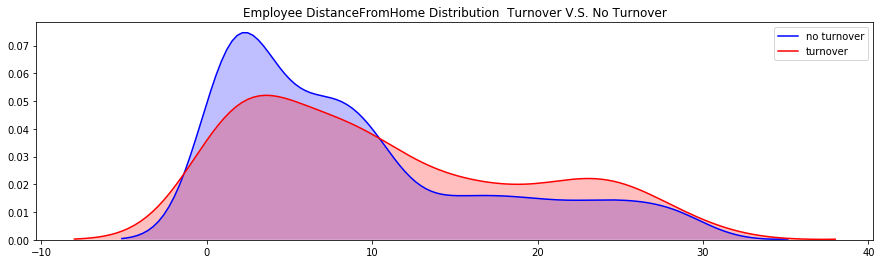

In [41]:
fig = plt.figure(figsize=(15,4),)
ax=sns.kdeplot(df.loc[(df['Attrition'] == 'No'),'DistanceFromHome'] , color='b',shade=True,label='no turnover')
ax=sns.kdeplot(df.loc[(df['Attrition'] == 'Yes'),'DistanceFromHome'] , color='r',shade=True, label='turnover')
a=plt.title('Employee DistanceFromHome Distribution  Turnover V.S. No Turnover')

# Employee education Turnover Distribution

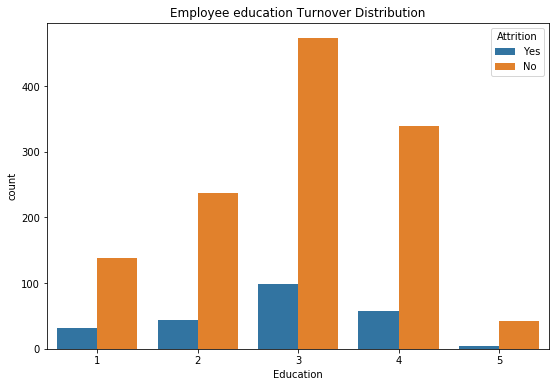

In [30]:
plt.figure(figsize=(9,6))
ax=sns.countplot(x=df['Education'],hue=df['Attrition']).set_title('Employee education Turnover Distribution')

In [43]:
hrleft = df[df['Attrition']=='Yes']

Eduleft = pd.DataFrame(hrleft.Education.value_counts()).reset_index()
Edustay = pd.DataFrame( df.Education.value_counts()).reset_index()

Edu_merge = pd.merge(Eduleft, Edustay, how='inner', on='index')

Edu_merge = Edu_merge.rename(columns={"Education_x":'left', "Education_y":'all', "index":'Education' })
Edu_merge

,Education,left,all
0,3,99,572
1,4,58,398
2,2,44,282
3,1,31,170
4,5,5,48


# Employee education Field Turnover Distribution 

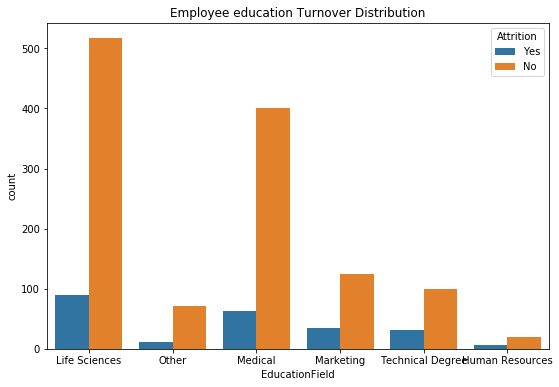

In [29]:
plt.figure(figsize=(9,6))
ax=sns.countplot(x=df['EducationField'],hue=df['Attrition']).set_title('Employee education Turnover Distribution')

In [45]:
hrleft = df[df['Attrition']=='Yes']

EduFleft = pd.DataFrame(hrleft.EducationField.value_counts()).reset_index()
EduFstay = pd.DataFrame( df.EducationField.value_counts()).reset_index()

EduF_merge = pd.merge(EduFleft, EduFstay, how='inner', on='index')

EduF_merge = EduF_merge.rename(columns={"EducationField_x":'left', "EducationField_y":'all', "index":'EducationField' })
EduF_merge

,EducationField,left,all
0,Life Sciences,89,606
1,Medical,63,464
2,Marketing,35,159
3,Technical Degree,32,132
4,Other,11,82
5,Human Resources,7,27


# Employee EnvironmentSatisfaction Turnover Distribution

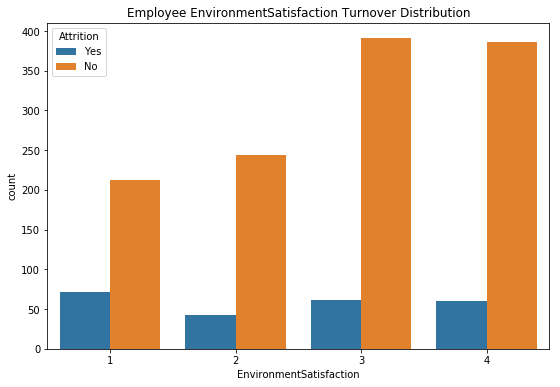

In [28]:
plt.figure(figsize=(9,6))
ax=sns.countplot(x=df['EnvironmentSatisfaction'],hue=df['Attrition']).set_title('Employee EnvironmentSatisfaction Turnover Distribution')

In [47]:
hrleft = df[df['Attrition']=='Yes']

Envleft = pd.DataFrame(hrleft.EnvironmentSatisfaction.value_counts()).reset_index()
Envstay = pd.DataFrame( df.EnvironmentSatisfaction.value_counts()).reset_index()

Env_merge = pd.merge(Envleft, Envstay, how='inner', on='index')

Env_merge = Env_merge.rename(columns={"EnvironmentSatisfaction_x":'left', "EnvironmentSatisfaction_y":'all', "index":'EnvironmentSatisfaction' })
Env_merge

,EnvironmentSatisfaction,left,all
0,1,72,284
1,3,62,453
2,4,60,446
3,2,43,287


# Employee gender Turnover Distribution

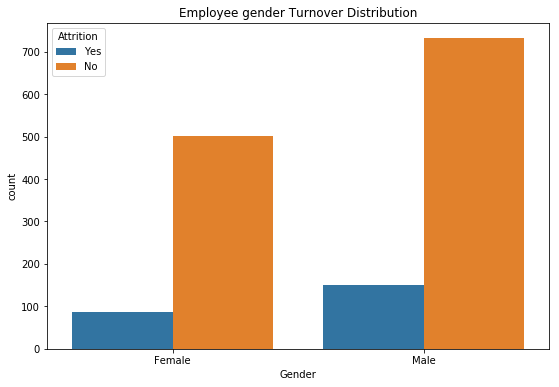

In [27]:
plt.figure(figsize=(9,6))
ax=sns.countplot(x=df['Gender'],hue=df['Attrition']).set_title('Employee gender Turnover Distribution')

In [49]:
hrleft = df[df['Attrition']=='Yes']

Gleft = pd.DataFrame(hrleft.Gender.value_counts()).reset_index()
Gstay = pd.DataFrame( df.Gender.value_counts()).reset_index()

G_merge = pd.merge(Gleft, Gstay, how='inner', on='index')

G_merge = G_merge.rename(columns={"Gender_x":'left', "Gender_y":'all', "index":'Gender' })
G_merge

,Gender,left,all
0,Male,150,882
1,Female,87,588


# Employee DailyRate Distribution  Turnover V.S. No Turnover

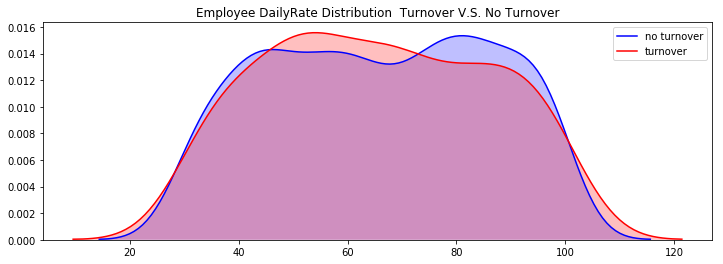

In [26]:
fig = plt.figure(figsize=(12,4),)
ax=sns.kdeplot(df.loc[(df['Attrition'] == 'No'),'HourlyRate'] , color='b',shade=True,label='no turnover')
ax=sns.kdeplot(df.loc[(df['Attrition'] == 'Yes'),'HourlyRate'] , color='r',shade=True, label='turnover')
a=plt.title('Employee DailyRate Distribution  Turnover V.S. No Turnover')

# Employee JobRole Turnover Distribution

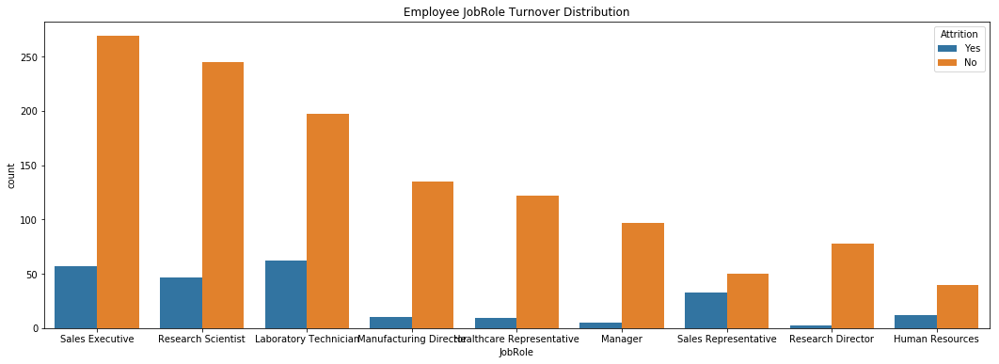

In [25]:
plt.figure(figsize=(18,6))
ax=sns.countplot(x=df['JobRole'],hue=df['Attrition']).set_title('Employee JobRole Turnover Distribution')

In [6]:
hrleft = df[df['Attrition']=='Yes']

Rleft = pd.DataFrame(hrleft.JobRole.value_counts()).reset_index()
Rstay = pd.DataFrame( df.JobRole.value_counts()).reset_index()

R_merge = pd.merge(Rleft,Rstay, how='inner', on='index')

R_merge = R_merge.rename(columns={"JobRole_x":'left', "JobRole_y":'all', "index":'JobRole' })
R_merge

,JobRole,left,all
0,Laboratory Technician,62,259
1,Sales Executive,57,326
2,Research Scientist,47,292
3,Sales Representative,33,83
4,Human Resources,12,52
5,Manufacturing Director,10,145
6,Healthcare Representative,9,131
7,Manager,5,102
8,Research Director,2,80


# Employee JobSatisfaction Turnover Distribution

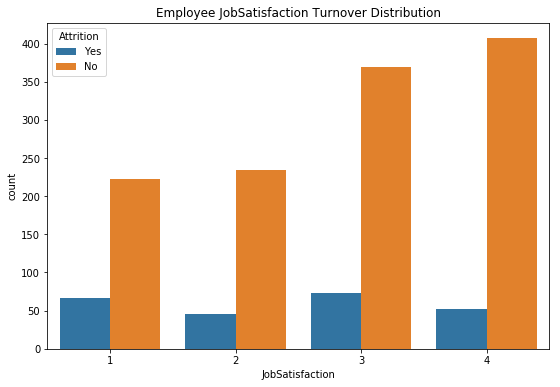

In [22]:
plt.figure(figsize=(9,6))
ax=sns.countplot(x=df['JobSatisfaction'],hue=df['Attrition']).set_title('Employee JobSatisfaction Turnover Distribution')

In [54]:
hrleft = df[df['Attrition']=='Yes']

Jleft = pd.DataFrame(hrleft.JobSatisfaction.value_counts()).reset_index()
Jstay = pd.DataFrame( df.JobSatisfaction.value_counts()).reset_index()

J_merge = pd.merge(Jleft,Jstay, how='inner', on='index')

J_merge = J_merge.rename(columns={"JobSatisfaction_x":'left', "JobSatisfaction_y":'all', "index":'JobRole' })
J_merge

,JobRole,left,all
0,3,73,442
1,1,66,289
2,4,52,459
3,2,46,280


# Employee OverTime Turnover Distribution

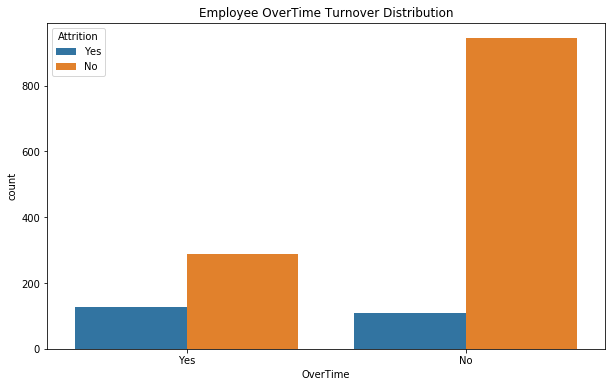

In [21]:
plt.figure(figsize=(10,6))
ax=sns.countplot(x=df['OverTime'],hue=df['Attrition']).set_title('Employee OverTime Turnover Distribution')

In [56]:
hrleft = df[df['Attrition']=='Yes']

Oleft = pd.DataFrame(hrleft.OverTime.value_counts()).reset_index()
Ostay = pd.DataFrame( df.OverTime.value_counts()).reset_index()

O_merge = pd.merge(Oleft,Ostay, how='inner', on='index')

O_merge = O_merge.rename(columns={"OverTime_x":'left', "OverTime_y":'all', "index":'OverTime' })
O_merge

,OverTime,left,all
0,Yes,127,416
1,No,110,1054


In [10]:
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
OverTime                    object
PercentSalaryHike            int64
RelationshipSatisfaction     int64
StockOptionLevel             int64
TrainingTimesLastYear        int64
WorkLifeBalance              int64
YearsAtCompany               int64
YearsInCurrentRole           int64
YearsSinceLastPromotion      int64
YearsWithCurrManager         int64
dtype: object

In [11]:
df.shape

(1470, 27)

# Pre-processing

In [5]:
cat_var = ['BusinessTravel','Department','EducationField','Gender','MaritalStatus','OverTime']
num_var = ['Age', 'DailyRate', 'DistanceFromHome', 'Education',
       'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement',
       'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'PercentSalaryHike', 'RelationshipSatisfaction', 'StockOptionLevel',
       'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager']

In [6]:
df_cat = pd.get_dummies(df[cat_var])

In [7]:
df_cat.columns.tolist()

['BusinessTravel_Non-Travel',
 'BusinessTravel_Travel_Frequently',
 'BusinessTravel_Travel_Rarely',
 'Department_Human Resources',
 'Department_Research & Development',
 'Department_Sales',
 'EducationField_Human Resources',
 'EducationField_Life Sciences',
 'EducationField_Marketing',
 'EducationField_Medical',
 'EducationField_Other',
 'EducationField_Technical Degree',
 'Gender_Female',
 'Gender_Male',
 'MaritalStatus_Divorced',
 'MaritalStatus_Married',
 'MaritalStatus_Single',
 'OverTime_No',
 'OverTime_Yes']

In [8]:
df_num=df[num_var]

In [9]:
df_num.shape

(1470, 20)

In [38]:
attrition=pd.concat([df_num,df_cat], axis=1)

In [39]:
attrition

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobSatisfaction,MonthlyIncome,MonthlyRate,...,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,OverTime_No,OverTime_Yes
0,41,1102,1,2,2,94,3,4,5993,19479,...,0,0,0,1,0,0,0,1,0,1
1,49,279,8,1,3,61,2,2,5130,24907,...,0,0,0,0,1,0,1,0,1,0
2,37,1373,2,2,4,92,2,3,2090,2396,...,0,1,0,0,1,0,0,1,0,1
3,33,1392,3,4,4,56,3,3,2909,23159,...,0,0,0,1,0,0,1,0,0,1
4,27,591,2,1,1,40,3,2,3468,16632,...,1,0,0,0,1,0,1,0,1,0
5,32,1005,2,2,4,79,3,4,3068,11864,...,0,0,0,0,1,0,0,1,1,0
6,59,1324,3,3,3,81,4,1,2670,9964,...,1,0,0,1,0,0,1,0,0,1
7,30,1358,24,1,4,67,3,3,2693,13335,...,0,0,0,0,1,1,0,0,1,0
8,38,216,23,3,4,44,2,3,9526,8787,...,0,0,0,0,1,0,0,1,1,0
9,36,1299,27,3,3,94,3,3,5237,16577,...,1,0,0,0,1,0,1,0,1,0


In [11]:
attrition.shape

(1470, 39)

In [12]:
attrition.iloc[0]

Age                                     41
DailyRate                             1102
DistanceFromHome                         1
Education                                2
EnvironmentSatisfaction                  2
HourlyRate                              94
JobInvolvement                           3
JobSatisfaction                          4
MonthlyIncome                         5993
MonthlyRate                          19479
NumCompaniesWorked                       8
PercentSalaryHike                       11
RelationshipSatisfaction                 1
StockOptionLevel                         0
TrainingTimesLastYear                    0
WorkLifeBalance                          1
YearsAtCompany                           6
YearsInCurrentRole                       4
YearsSinceLastPromotion                  0
YearsWithCurrManager                     5
BusinessTravel_Non-Travel                0
BusinessTravel_Travel_Frequently         0
BusinessTravel_Travel_Rarely             1
Department_

In [13]:
# Define a dictionary for the target mapping
target_map = {'Yes':1, 'No':0}
# Use the pandas apply method to numerically encode our attrition target variable
target = df["Attrition"].apply(lambda x: target_map[x])

In [47]:

from sklearn.model_selection import train_test_split
train, test, target_train, target_test = train_test_split(attrition, 
                                                         target, 
                                                         train_size= 0.80,
                                                         random_state=123,
                                                         stratify=target);

In [43]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
train[['Age', 'DailyRate', 'DistanceFromHome', 'Education',
       'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement',
       'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'PercentSalaryHike', 'RelationshipSatisfaction', 'StockOptionLevel',
       'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager',
       'BusinessTravel_Non-Travel', 'BusinessTravel_Travel_Frequently',
       'BusinessTravel_Travel_Rarely', 'Department_Human Resources',
       'Department_Research & Development', 'Department_Sales',
       'EducationField_Human Resources', 'EducationField_Life Sciences',
       'EducationField_Marketing', 'EducationField_Medical',
       'EducationField_Other', 'EducationField_Technical Degree',
       'Gender_Female', 'Gender_Male', 'MaritalStatus_Divorced',
       'MaritalStatus_Married', 'MaritalStatus_Single', 'OverTime_No',
       'OverTime_Yes']] = scaler.fit_transform( train )
test = scaler.transform( test )

/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

/home/ubuntu/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [46]:
train.tail()

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobSatisfaction,MonthlyIncome,MonthlyRate,...,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,OverTime_No,OverTime_Yes
568,2.013403,-0.224258,-0.888647,0.072424,1.189551,0.608909,0.398402,-1.576293,2.926084,0.954065,...,1.455803,-0.24188,-0.311472,-0.805834,0.805834,-0.522233,1.072338,-0.686906,-1.618166,1.618166
826,0.131151,-0.947647,-1.011334,0.072424,0.266177,-1.405302,1.788672,0.247338,-0.770731,-1.183542,...,-0.686906,-0.24188,-0.311472,-0.805834,0.805834,-0.522233,1.072338,-0.686906,0.617984,-0.617984
1447,-0.090290,-1.274659,0.706286,1.040279,1.189551,1.100180,-2.382138,1.159153,-0.214090,-0.560056,...,-0.686906,-0.24188,-0.311472,-0.805834,0.805834,1.914854,-0.932542,-0.686906,0.617984,-0.617984
691,0.352593,1.618898,-0.029837,1.040279,1.189551,-1.503556,0.398402,-0.664478,-0.602783,1.497646,...,1.455803,-0.24188,-0.311472,-0.805834,0.805834,1.914854,-0.932542,-0.686906,-1.618166,1.618166
669,0.241872,0.759254,-0.397899,0.072424,1.189551,0.215892,0.398402,-1.576293,-0.866329,-1.422836,...,1.455803,-0.24188,-0.311472,-0.805834,0.805834,-0.522233,1.072338,-0.686906,-1.618166,1.618166


In [17]:
from imblearn.over_sampling import SMOTE

oversampler=SMOTE(random_state=0)
smote_train, smote_target = oversampler.fit_sample(train,target_train)

Using TensorFlow backend.


In [18]:
smote_train.shape

(1972, 39)

In [19]:
train

array([[-0.75461425,  1.13829021,  2.30121862, ..., -0.68690596,
         0.61798353, -0.61798353],
       [-0.20101078,  0.96239763, -0.64327292, ...,  1.45580335,
        -1.6181661 ,  1.6181661 ],
       [-0.09029009, -0.44722043,  0.09284997, ...,  1.45580335,
         0.61798353, -0.61798353],
       ...,
       [-0.09029009, -1.27465879,  0.7062857 , ..., -0.68690596,
         0.61798353, -0.61798353],
       [ 0.35259268,  1.61889813, -0.02983718, ..., -0.68690596,
        -1.6181661 ,  1.6181661 ],
       [ 0.24187199,  0.75925408, -0.39789862, ..., -0.68690596,
        -1.6181661 ,  1.6181661 ]])

In [20]:
smote_target.value_counts()

1    986
0    986
Name: Attrition, dtype: int64

In [34]:
import plotly.graph_objs as go
import plotly.offline as py
plt.figure(figsize=(11,8.5))
trace = go.Bar(y = (986, 986), x = ['Yes_attrition', 'No_attrition'], orientation = 'v', opacity = 0.5, marker=dict(
        color=['gold', 'lightskyblue'],
        line=dict(color='#000000',width=0.5)))

layout = dict(title =  'Count of attrition variable')
                    
fig = dict(data = [trace], layout=layout)

py.iplot(fig)

<Figure size 792x612 with 0 Axes>

In [87]:
model = pd.DataFrame()

# Random Forest

In [54]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import (accuracy_score,f1_score, log_loss, classification_report)
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import roc_auc_score

In [55]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
#print(random_grid)

In [56]:
rf= RandomForestClassifier()
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 10,scoring='f1', cv = 20, verbose=2, random_state=42, n_jobs = -1)

In [88]:
# Fit the random search model
rf_random.fit(smote_train, smote_target)

Fitting 20 folds for each of 10 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   11.4s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:  3.0min finished


RandomizedSearchCV(cv=20, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
              

In [58]:
rf_random.best_score_

0.9319984946367514

In [61]:
rf_random.best_params_

{'n_estimators': 2000,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': 50,
 'bootstrap': False}

In [59]:
rf_params=rf_random.best_params_

In [60]:
rf_best = RandomForestClassifier(**rf_params)
rf_best.fit(smote_train, smote_target)

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=50, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=2, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=2000,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [64]:
smote_train.shape

(1972, 40)

In [102]:
rf= RandomForestClassifier(n_estimators= 3,
 min_samples_split= 2,
 min_samples_leaf= 2,
 max_features= 'auto',
 max_depth= 3,
 bootstrap= False)

In [103]:
rf.fit(smote_train, smote_target)

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=3, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=2, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=3,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [106]:
# Extract single tree
estimator = rf_best.estimators_[1]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = smote_train.columns.tolist() ,
                class_names = np.array(["0","1"]),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

In [34]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(target_test, rf_best.predict(test))
print(cm)

[[242   5]
 [ 31  16]]


In [35]:
print ("\n\n ---Random Forest Model---")
rf_f1_score = f1_score(target_test, rf_best.predict(test))
print ("Random Forest f1_score = %2.2f" % rf_f1_score)
print(classification_report(target_test, rf_best.predict(test)))



 ---Random Forest Model---
Random Forest f1_score = 0.47
              precision    recall  f1-score   support

           0       0.89      0.98      0.93       247
           1       0.76      0.34      0.47        47

    accuracy                           0.88       294
   macro avg       0.82      0.66      0.70       294
weighted avg       0.87      0.88      0.86       294



In [37]:
model=model.append({'model':'Random Forest','accuracy':0.88,'f1-score_0':0.93,
                    'f1-score_1': 0.47},ignore_index=True)

In [50]:
model

,accuracy,f1-score_0,f1-score_1,model
0,0.88,0.93,0.47,Random Forest


In [36]:
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

# Scatter plot 
trace = go.Scatter(
    y = rf_best.feature_importances_,
    x = attrition.columns.values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 13,
        #size= rf.feature_importances_,
        #color = np.random.randn(500), #set color equal to a variable
        color = rf_best.feature_importances_,
        colorscale='Portland',
        showscale=True
    ),
    text = attrition.columns.values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'Random Forest Feature Importance',
    hovermode= 'closest',
     xaxis= dict(
         ticklen= 5,
         showgrid=False,
        zeroline=False,
        showline=False
     ),
    yaxis=dict(
        title= 'Feature Importance',
        showgrid=False,
        zeroline=False,
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

# Logistic Regression

In [38]:
from sklearn.linear_model import LogisticRegression
param_grid = {
     'penalty' : ['l1', 'l2'],
    'C' : np.logspace(-4, 4, 20),
    'solver' : ['liblinear','saga'],
    'class_weight' : [{1:0.5, 0:0.5}, {1:0.4, 0:0.6}, {1:0.6, 0:0.4}, {1:0.7, 0:0.3}]}

lr=LogisticRegression()
# Create grid search object

clf = RandomizedSearchCV(estimator = lr, param_distributions = param_grid,
                         n_iter = 10, cv = 20, verbose=True, n_jobs=-1,scoring="precision")

# Fit on data

clf.fit(smote_train, smote_target)

Fitting 20 folds for each of 10 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    4.3s finished


RandomizedSearchCV(cv=20, error_score=nan,
                   estimator=LogisticRegression(C=1.0, class_weight=None,
                                                dual=False, fit_intercept=True,
                                                intercept_scaling=1,
                                                l1_ratio=None, max_iter=100,
                                                multi_class='auto', n_jobs=None,
                                                penalty='l2', random_state=None,
                                                solver='lbfgs', tol=0.0001,
                                                verbose=0, warm_start=False),
                   iid='deprecated', n_iter=10, n_jobs=-1,
                   param_distributions={'C': a...
       1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
       5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
                                        'class_weight': [{0: 0.5, 1: 0.5},
             

In [39]:
lr_params=clf.best_params_

In [40]:
lr_best = LogisticRegression(**lr_params)
lr_best.fit(smote_train, smote_target)

LogisticRegression(C=11.288378916846883, class_weight={0: 0.5, 1: 0.5},
                   dual=False, fit_intercept=True, intercept_scaling=1,
                   l1_ratio=None, max_iter=100, multi_class='auto', n_jobs=None,
                   penalty='l2', random_state=None, solver='liblinear',
                   tol=0.0001, verbose=0, warm_start=False)

In [41]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(target_test, lr_best.predict(test))
print(cm)

[[196  51]
 [ 13  34]]


In [42]:
print ("\n\n ---Logistic Regression Model---")
lr_f1_score = f1_score(target_test, lr_best.predict(test))
print ("Logistic Regression f1_score = %2.2f" % lr_f1_score)
print(classification_report(target_test, lr_best.predict(test)))



 ---Logistic Regression Model---
Logistic Regression f1_score = 0.52
              precision    recall  f1-score   support

           0       0.94      0.79      0.86       247
           1       0.40      0.72      0.52        47

    accuracy                           0.78       294
   macro avg       0.67      0.76      0.69       294
weighted avg       0.85      0.78      0.80       294



In [57]:
model=model.append({'model':'Logistic Regression','accuracy':0.82,'f1-score_0':0.89,
                    'f1-score_1': 0.53},ignore_index=True)

# Gradient Boosting Classifier

In [43]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV

In [44]:
parameters = {
    "loss":["deviance"],
    "learning_rate": [0.01, 0.025, 0.05, 0.075, 0.1, 0.15, 0.2],
    "min_samples_split": np.linspace(0.1, 0.5, 12),
    "min_samples_leaf": np.linspace(0.1, 0.5, 12),
    "max_depth":[3,5,8],
    "max_features":["log2","sqrt"],
    "criterion": ["friedman_mse",  "mae"],
    "subsample":[0.5, 0.618, 0.8, 0.85, 0.9, 0.95, 1.0],
    "n_estimators":[10]
    }

clf = RandomizedSearchCV(estimator = GradientBoostingClassifier(),scoring='f1',param_distributions = parameters, n_iter = 100, cv = 20, verbose=True, n_jobs=-1)

In [45]:
# Fit on data

clf.fit(smote_train, smote_target)

Fitting 20 folds for each of 100 candidates, totalling 2000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 696 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done 1720 tasks      | elapsed:   22.7s
[Parallel(n_jobs=-1)]: Done 2000 out of 2000 | elapsed:   26.9s finished


RandomizedSearchCV(cv=20, error_score=nan,
                   estimator=GradientBoostingClassifier(ccp_alpha=0.0,
                                                        criterion='friedman_mse',
                                                        init=None,
                                                        learning_rate=0.1,
                                                        loss='deviance',
                                                        max_depth=3,
                                                        max_features=None,
                                                        max_leaf_nodes=None,
                                                        min_impurity_decrease=0.0,
                                                        min_impurity_split=None,
                                                        min_samples_leaf=1,
                                                        min_samples_split=2,
                                                   

In [46]:
gb_params=clf.best_params_
gb_best = GradientBoostingClassifier(**gb_params)
gb_best.fit(smote_train, smote_target)

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.2, loss='deviance', max_depth=8,
                           max_features='log2', max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=0.1,
                           min_samples_split=0.24545454545454548,
                           min_weight_fraction_leaf=0.0, n_estimators=10,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=None, subsample=0.8, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [47]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(target_test, gb_best.predict(test))
print(cm)

[[196  51]
 [ 17  30]]


In [48]:
print ("---Gradient Boosting Classifier Model---\n ")
gb_roc_f1_score = f1_score(target_test, gb_best.predict(test))

print ("Gradient Boosting Classifier f1_score = %2.2f \n" % gb_roc_f1_score)
print('='*60)
print(classification_report(target_test, gb_best.predict(test)))

---Gradient Boosting Classifier Model---
 
Gradient Boosting Classifier f1_score = 0.47 

              precision    recall  f1-score   support

           0       0.92      0.79      0.85       247
           1       0.37      0.64      0.47        47

    accuracy                           0.77       294
   macro avg       0.65      0.72      0.66       294
weighted avg       0.83      0.77      0.79       294



In [85]:
model=model.append({'model':'Gradient Boosting','accuracy':0.80,'f1-score_0':0.88,
                    'f1-score_1': 0.5},ignore_index=True)

In [86]:
# Scatter plot 
trace = go.Scatter(
    y = gb_best.feature_importances_,
    x = attrition.columns.values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 13,
        #size= rf.feature_importances_,
        #color = np.random.randn(500), #set color equal to a variable
        color = gb_best.feature_importances_,
        colorscale='Portland',
        showscale=True
    ),
    text = attrition.columns.values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'Gradient Boosting Model Feature Importance',
    hovermode= 'closest',
     xaxis= dict(
         ticklen= 5,
         showgrid=False,
        zeroline=False,
        showline=False
     ),
    yaxis=dict(
        title= 'Feature Importance',
        showgrid=False,
        zeroline=False,
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter')

# SVM

In [49]:
from sklearn.svm import SVC 

In [50]:
param_grid = {'C': [0.1,1, 10, 100],
              'gamma': [1,0.1,0.01,0.001],
              'kernel': ['rbf', 'poly', 'sigmoid']}
grid=RandomizedSearchCV(estimator = SVC(), param_distributions = param_grid,scoring='precision', n_iter = 10, cv = 20, verbose=2, n_jobs=-1)
grid.fit(smote_train, smote_target)

Fitting 20 folds for each of 10 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    9.7s finished


RandomizedSearchCV(cv=20, error_score=nan,
                   estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                                 class_weight=None, coef0=0.0,
                                 decision_function_shape='ovr', degree=3,
                                 gamma='scale', kernel='rbf', max_iter=-1,
                                 probability=False, random_state=None,
                                 shrinking=True, tol=0.001, verbose=False),
                   iid='deprecated', n_iter=10, n_jobs=-1,
                   param_distributions={'C': [0.1, 1, 10, 100],
                                        'gamma': [1, 0.1, 0.01, 0.001],
                                        'kernel': ['rbf', 'poly', 'sigmoid']},
                   pre_dispatch='2*n_jobs', random_state=None, refit=True,
                   return_train_score=False, scoring='precision', verbose=2)

In [51]:
svc_params=grid.best_params_
svc_best = SVC(**svc_params)
svc_best.fit(smote_train, smote_target)

SVC(C=1, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=1, kernel='rbf', max_iter=-1,
    probability=False, random_state=None, shrinking=True, tol=0.001,
    verbose=False)

In [52]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(target_test, svc_best.predict(test))
print(cm)

[[247   0]
 [ 47   0]]


In [53]:
print ("---SVC Model---\n\n ")
svc_f1_score = f1_score(target_test, svc_best.predict(test))
print ("SVC f1_score = %2.2f" % svc_f1_score)
print('='*60)
print(classification_report(target_test, svc_best.predict(test)))

---SVC Model---

 
SVC f1_score = 0.00
              precision    recall  f1-score   support

           0       0.84      1.00      0.91       247
           1       0.00      0.00      0.00        47

    accuracy                           0.84       294
   macro avg       0.42      0.50      0.46       294
weighted avg       0.71      0.84      0.77       294



/home/ubuntu/anaconda3/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/home/ubuntu/anaconda3/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/home/ubuntu/anaconda3/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [123]:
model=model.append({'model':'SVC','accuracy':0.81,'f1-score_0':0.89,
                    'f1-score_1': 0.40},ignore_index=True)

# KNN

In [54]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()

In [55]:
#List Hyperparameters that we want to tune.
leaf_size = list(range(1,50))
n_neighbors = list(range(1,30))
p=[1,2]
#Convert to dictionary
hyperparameters = dict(leaf_size=leaf_size, n_neighbors=n_neighbors, p=p)

In [56]:
knn = KNeighborsClassifier()
knn_random = RandomizedSearchCV(estimator = knn, param_distributions = hyperparameters, n_iter = 100,scoring='f1', cv = 20, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
knn_random.fit(smote_train, smote_target)

Fitting 20 folds for each of 100 candidates, totalling 2000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 1316 tasks      | elapsed:   11.1s
[Parallel(n_jobs=-1)]: Done 2000 out of 2000 | elapsed:   17.0s finished


RandomizedSearchCV(cv=20, error_score=nan,
                   estimator=KNeighborsClassifier(algorithm='auto',
                                                  leaf_size=30,
                                                  metric='minkowski',
                                                  metric_params=None,
                                                  n_jobs=None, n_neighbors=5,
                                                  p=2, weights='uniform'),
                   iid='deprecated', n_iter=100, n_jobs=-1,
                   param_distributions={'leaf_size': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                      10, 11, 12, 13, 14, 15,
                                                      16, 17, 18, 19, 20, 21,
                                                      22, 23, 24, 25, 26, 27,
                                                      28, 29, 30, ...],
                                        'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8,
     

In [57]:
knn_params=knn_random.best_params_
knn_best = KNeighborsClassifier(**knn_params)
knn_best.fit(smote_train, smote_target)

KNeighborsClassifier(algorithm='auto', leaf_size=7, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=4, p=1,
                     weights='uniform')

In [58]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(target_test, knn_best.predict(test))
print(cm)

[[211  36]
 [ 34  13]]


In [59]:
print ("---K Neighbors Classifier Model---\n\n ")
knn_roc_auc = roc_auc_score(target_test, knn_best.predict(test))
print ("K Neighbors Classifier AUC = %2.2f" % knn_roc_auc)
print('='*60)
print(classification_report(target_test, knn_best.predict(test)))

---K Neighbors Classifier Model---

 
K Neighbors Classifier AUC = 0.57
              precision    recall  f1-score   support

           0       0.86      0.85      0.86       247
           1       0.27      0.28      0.27        47

    accuracy                           0.76       294
   macro avg       0.56      0.57      0.56       294
weighted avg       0.77      0.76      0.76       294



In [130]:
model=model.append({'model':'K Neighbors','accuracy':0.76,'f1-score_0': 0.86,
                    'f1-score_1': 0.27},ignore_index=True)

# Neural Network

In [60]:
from keras import Sequential
from keras.layers import Dense,Dropout, Activation

In [61]:
classifier = Sequential()

classifier.add(Dense(24, activation='sigmoid', kernel_initializer='random_normal', input_dim=45))
classifier.add(Dropout(0.2))


classifier.add(Dense(12, activation='sigmoid', kernel_initializer='random_normal'))
classifier.add(Dropout(0.2))

classifier.add(Dense(1, activation='sigmoid', kernel_initializer='random_normal'))

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [62]:
#Compiling the neural network
classifier.compile(optimizer ='adam',loss='binary_crossentropy', metrics =['accuracy'])

In [63]:
#Fitting the data to the training dataset
classifier.fit(smote_train,smote_target, batch_size=10, epochs=100)

Instructions for updating:
Use tf.cast instead.
Epoch 1/100
1972/1972 [==============================] - 2s 850us/step - loss: 0.6908 - acc: 0.5319
Epoch 2/100
1972/1972 [==============================] - 0s 139us/step - loss: 0.6533 - acc: 0.7125
Epoch 3/100
1972/1972 [==============================] - 0s 157us/step - loss: 0.5568 - acc: 0.7622
Epoch 4/100
1972/1972 [==============================] - 0s 121us/step - loss: 0.4963 - acc: 0.7916
Epoch 5/100
1972/1972 [==============================] - 0s 110us/step - loss: 0.4746 - acc: 0.7997
Epoch 6/100
1972/1972 [==============================] - 0s 153us/step - loss: 0.4605 - acc: 0.7987
Epoch 7/100
1972/1972 [==============================] - 0s 135us/step - loss: 0.4590 - acc: 0.8058
Epoch 8/100
1972/1972 [==============================] - 0s 111us/step - loss: 0.4548 - acc: 0.8048
Epoch 9/100
1972/1972 [==============================] - 0s 121us/step - loss: 0.4537 - acc: 0.8088
Epoch 10/100
1972/1972 [============================

In [64]:
eval_model = classifier.evaluate (smote_train, smote_target) 
eval_model

1972/1972 [==============================] - 0s 89us/step


[0.24767187219604275, 0.862576065150526]

In [65]:
y_pred = classifier.predict (test) 
pred=[1 if p>0.8 else 0 for p in y_pred]

In [66]:
print(classification_report(target_test, pred))

              precision    recall  f1-score   support

           0       0.90      0.96      0.93       247
           1       0.65      0.43      0.51        47

    accuracy                           0.87       294
   macro avg       0.77      0.69      0.72       294
weighted avg       0.86      0.87      0.86       294



In [138]:
model=model.append({'model':'Neural Network','accuracy':0.87,'f1-score_0': 0.93,
                    'f1-score_1': 0.50},ignore_index=True)

In [139]:
target_test.value_counts()

0    247
1     47
Name: Attrition, dtype: int64

In [140]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(target_test, pred)
print(cm)

[[237  10]
 [ 28  19]]


In [141]:
model=model[['model','accuracy','f1-score_0','f1-score_1']]

In [142]:
model

,model,accuracy,f1-score_0,f1-score_1
0,Random Forest,0.88,0.93,0.47
1,Logistic Regression,0.82,0.89,0.53
2,Gradient Boosting,0.80,0.88,0.50
3,SVC,0.81,0.89,0.40
4,K Neighbors,0.76,0.86,0.27
5,Neural Network,0.87,0.93,0.50


===================================================================================

===================================================================================

===================================================================================

___________________________________________________________________________________________

In [68]:
import joblib

In [128]:
joblib.dump(scaler, "./encoders.joblib", compress=True)
joblib.dump(svc_best, "./svc.joblib", compress=True)
joblib.dump(rf_best, "./random_forest.joblib", compress=True)

['./random_forest.joblib']

In [69]:
joblib.dump(classifier, "./NN.joblib", compress=True)
joblib.dump(lr_best, "./lr.joblib", compress=True)

['./lr.joblib']